<a href="https://colab.research.google.com/github/Avov7/Machine_Learning_HIT/blob/main/bodycam_weapon_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###1. Clean and Corrected Installation

This cell is designed to set up a specific Python environment within your Colab instance. It defines a `LOCAL_LIB_PATH` to `/content/my_env` where all specified libraries will be installed. It then installs custom libraries like `diffusers`, `accelerate`, etc., performs a critical `mediapipe` version upgrade to ensure compatibility, and finally installs or updates standard libraries such as `torch`, `numpy`, `opencv-python`, and `pillow`. This process helps manage dependencies and ensures a consistent environment for the project.

In [ ]:
# --- שלב 2: התקנה נקייה ומתוקנת ---
import os

# נתיב ההתקנה המקומי
LOCAL_LIB_PATH = "/content/my_env"

# רשימת הספריות המיוחדות (הוספתי את albumentations)
custom_libs = "diffusers accelerate transformers safetensors albumentations roboflow controlnet_aux peft"

print(f"🛠️ מתקין ספריות מיוחדות לתוך {LOCAL_LIB_PATH}...")
# 1. מתקין את הספריות המורכבות
!pip install -q --target=$LOCAL_LIB_PATH {custom_libs}

# 2. התיקון הקריטי: משדרג את mediapipe מיד אחרי ההתקנה
print("🔧 מבצע תיקון גרסאות ל-mediapipe...")
!pip install --upgrade mediapipe

# 3. ספריות בסיס
standard_libs = "torch torchvision numpy opencv-python pillow"
print("⚙️ מוודא שספריות הבסיס מעודכנות..." )
!pip install -q {standard_libs}

print("✅ סיימנו התקנות! הכל מוכן.")

🛠️ מתקין ספריות מיוחדות לתוך /content/my_env...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.32.5 which is incompatible.
datasets 4.0.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2025.12.0 which is incompatible.
gradio 5.50.0 requires pillow<12.0,>=8.0, but you have pillow 12.0.0 which is incompatible.
gradio 5.50.0 requires pydantic<=2.12.3,>=2.0, but you have pydantic 2.12.5 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 2.3.5 which is incompatible.
torchaudio 2.9.0+cu126 requires torch==2.9.0, but you have torch 2.9.1 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have num

### 2. Mount Drive

In [ ]:
import os
import sys
import subprocess
from google.colab import drive

# 1. חיבור לדרייב
drive.mount('/content/drive')

# --- הגדרות נתיבים ---
# נתיב בדרייב לשמירת הספריות (הגיבוי)
DRIVE_LIB_PATH = "/content/drive/MyDrive/colab_env_cache_v2"
# נתיב מקומי ב-Colab (לביצועים מהירים)
LOCAL_LIB_PATH = "/content/my_env"

# יצירת התיקייה המקומית
os.makedirs(LOCAL_LIB_PATH, exist_ok=True)

# הוספת הנתיב המקומי לפייתון כדי שידע למצוא שם ספריות
if LOCAL_LIB_PATH not in sys.path:
    sys.path.insert(0, LOCAL_LIB_PATH)

print(f"🔄 בודק אם קיים גיבוי ב-Drive בנתיב: {DRIVE_LIB_PATH}...")

# בדיקה אם יש גיבוי בדרייב ושחזור
if os.path.exists(DRIVE_LIB_PATH):
    print("📥 נמצא גיבוי! משחזר ספריות באמצעות rsync...")
    subprocess.run(["rsync", "-a", f"{DRIVE_LIB_PATH}/", LOCAL_LIB_PATH])
    print("✅ השחזור הושלם! הספריות מוכנות.")
else:
    print("⚠️ לא נמצא גיבוי (פעם ראשונה). המשיך לשלב ההתקנה.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🔄 בודק אם קיים גיבוי ב-Drive בנתיב: /content/drive/MyDrive/colab_env_cache_v2...
⚠️ לא נמצא גיבוי (פעם ראשונה). המשיך לשלב ההתקנה.


###3. RSync if possible, not mandatory

In [ ]:
# ==========================================
# 💾 שמירת הסביבה ל-Drive (כדי לחסוך זמן בפעם הבאה) 💾
# ==========================================
import subprocess
import os

# הגדרת הנתיבים (חייבים להיות זהים למה שהגדרנו בתא 1)
DRIVE_LIB_PATH = "/content/drive/MyDrive/colab_env_cache_v2"
LOCAL_LIB_PATH = "/content/my_env"

print(f"⏳ מתחיל גיבוי של הסביבה מ-{LOCAL_LIB_PATH} ל-{DRIVE_LIB_PATH}...")
print("זה עשוי לקחת דקה או שתיים בפעם הראשונה...")

# יצירת התיקייה בדרייב אם לא קיימת
os.makedirs(DRIVE_LIB_PATH, exist_ok=True)

# הרצת RSYNC - מעתיק רק את מה שחדש/השתנה
# הדגל --delete מוחק מהדרייב קבצים שכבר לא קיימים אצלך (שומר על סנכרון מלא)
subprocess.run(["rsync", "-a", "--delete", f"{LOCAL_LIB_PATH}/", f"{DRIVE_LIB_PATH}/"])

print("✅ הגיבוי הושלם! בפעם הבאה הכל ייטען בשניות.")

⏳ מתחיל גיבוי של הסביבה מ-/content/my_env ל-/content/drive/MyDrive/colab_env_cache_v2...
זה עשוי לקחת דקה או שתיים בפעם הראשונה...


KeyboardInterrupt: 

### 4. Define bodycam augmentation effect, and fisheye

In [ ]:
# ==========================================
# 🛠️ שלב 3: פונקציות ה-Bodycam  🛠️
# ==========================================

import cv2
import numpy as np
import albumentations as A
import random
from PIL import Image

# 1. דחיסת JPEG (להוריד איכות בכוונה)
def jpeg_recompress(img_bgr, quality=35):
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)]
    ok, enc = cv2.imencode(".jpg", img_bgr, encode_param)
    if not ok: return img_bgr
    dec = cv2.imdecode(enc, cv2.IMREAD_COLOR)
    return dec

# 2. עיוות פישאיי (Fisheye) - כמו גו-פרו
def apply_fisheye(img_bgr, strength=0.15):
    h, w = img_bgr.shape[:2]
    K = np.array([[w, 0, w/2], [0, w, h/2], [0, 0, 1]], dtype=np.float32)
    D = np.array([strength, strength*0.4, 0.0, 0.0], dtype=np.float32)
    map1, map2 = cv2.fisheye.initUndistortRectifyMap(
        K, D, np.eye(3, dtype=np.float32), K, (w, h), cv2.CV_16SC2
    )
    return cv2.remap(img_bgr, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

# 3. עיוות כרומטי (הפרדת צבעים בקצוות)
def chromatic_aberration(img_bgr, shift=2):
    b, g, r = cv2.split(img_bgr)
    h, w = b.shape
    Mx = np.float32([[1, 0, shift], [0, 1, 0]])
    My = np.float32([[1, 0, -shift], [0, 1, 0]])
    r2 = cv2.warpAffine(r, Mx, (w, h), borderMode=cv2.BORDER_REFLECT)
    b2 = cv2.warpAffine(b, My, (w, h), borderMode=cv2.BORDER_REFLECT)
    return cv2.merge([b2, g, r2])

# 4. רולינג שאטר (מריחה של תנועה)
def rolling_shutter(img_bgr, max_shift=5):
    h, w = img_bgr.shape[:2]
    out = np.zeros_like(img_bgr)
    for y in range(h):
        s = int((y / (h - 1)) * max_shift) - max_shift // 2
        out[y] = np.roll(img_bgr[y], s, axis=0)
    return out

# 5. וינייט (השחרת פינות)
def add_vignette(img_bgr, strength=0.5):
    h, w = img_bgr.shape[:2]
    y, x = np.ogrid[:h, :w]
    cy, cx = h/2, w/2
    dist = np.sqrt((x - cx)**2 + (y - cy)**2)
    dist /= dist.max()
    mask = 1 - strength * (dist**1.6)
    mask = np.clip(mask, 0.2, 1.0).astype(np.float32)
    out = (img_bgr.astype(np.float32) * mask[..., None]).clip(0, 255).astype(np.uint8)
    return out

# 6. הגדרת ה-Pipeline של Albumentations (רעש, טשטוש)
def bodycam_augment_preset():
    return A.Compose([
        A.OneOf([
            A.MotionBlur(blur_limit=(7, 15), p=1.0),
            A.GaussianBlur(blur_limit=(3, 9), p=1.0),
        ], p=0.7),

        A.OneOf([
            A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.1, 0.5), p=1.0),
            A.GaussNoise(var_limit=(10, 50), p=1.0),
        ], p=0.8),

        A.RandomBrightnessContrast(brightness_limit=(-0.2, 0.1), contrast_limit=(-0.2, 0.2), p=0.6),

        A.OneOf([
            A.Perspective(scale=(0.02, 0.05), keep_size=True, p=1.0),
            A.Affine(translate_percent=(-0.02, 0.02), rotate=(-3, 3), shear=(-2, 2), p=1.0),
        ], p=0.4),
    ])

# --- הפונקציה הראשית שמפעילה הכל ---
def apply_bodycam_effects(img_pil):
    # המרה לפורמט שהפונקציות אוהבות (Numpy Array)
    img_rgb = np.array(img_pil.convert("RGB"))

    # 1. הפעלת Albumentations
    aug = bodycam_augment_preset()
    out = aug(image=img_rgb)["image"]
    out_bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)

    # 2. הפעלת אפקטים פיזיקליים
    if random.random() < 0.8: # סיכוי גבוה לפישאיי
        out_bgr = apply_fisheye(out_bgr, strength=random.uniform(0.1, 0.2))

    out_bgr = chromatic_aberration(out_bgr, shift=random.randint(1, 3))

    if random.random() < 0.5:
        out_bgr = rolling_shutter(out_bgr, max_shift=random.randint(2, 6))

    out_bgr = add_vignette(out_bgr, strength=random.uniform(0.3, 0.6))
    out_bgr = jpeg_recompress(out_bgr, quality=random.randint(30, 60))

    # החזרה ל-PIL כדי להציג ב-Colab
    out_rgb = cv2.cvtColor(out_bgr, cv2.COLOR_BGR2RGB)
    return Image.fromarray(out_rgb)

print("✅ פונקציות Bodycam נטענו בהצלחה.")

✅ פונקציות Bodycam נטענו בהצלחה.


### 5. Egohands dataset playground - try to inpaint weapons

🧪 מתחיל בדיקה על 5 תמונות במצב hands...
[1/5] מעבד: CARDS_COURTYARD_H_S_frame_1115_jpg.rf.2dc910340d663cd8c09ba8670d7338bf.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipython-input-466803950.py:70: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=1.0),


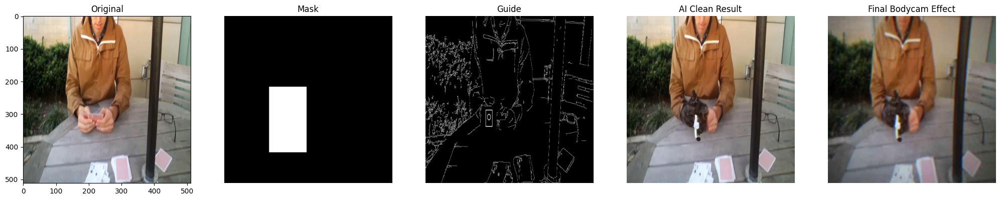

[2/5] מעבד: CARDS_COURTYARD_H_S_frame_2533_jpg.rf.1313db6ae63b6ee3d33cf121a606f9f8.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

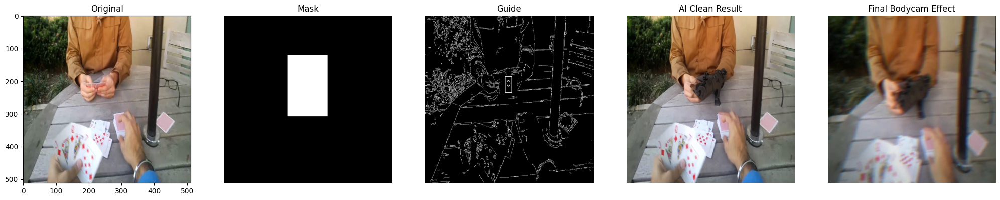

[3/5] מעבד: CARDS_LIVINGROOM_B_T_frame_0439_jpg.rf.a0a966db2fea0fb4ecdad8576f4811ab.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

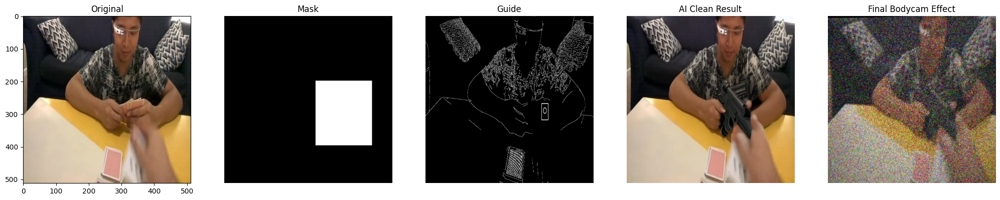

[4/5] מעבד: CARDS_LIVINGROOM_H_S_frame_1161_jpg.rf.ab44a80bf118428efec7cc93f88bc85f.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

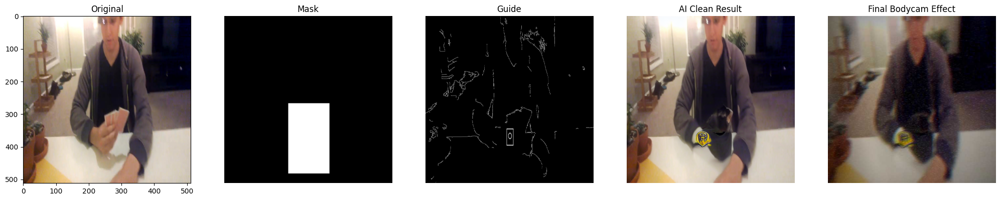

[5/5] מעבד: CARDS_OFFICE_H_T_frame_0293_jpg.rf.499c7e40ceb90f85b09733dcee9af172.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

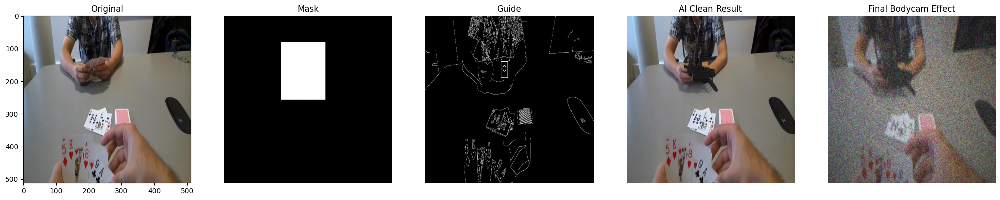

In [ ]:
import os
import glob
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from diffusers import StableDiffusionControlNetInpaintPipeline, ControlNetModel, UniPCMultistepScheduler

# ==========================================
# 🎛️ הגדרות המשתמש 🎛️
# ==========================================

MODE = "hands"

if MODE == "hands":
    LOCAL_DATASET_PATH = "/content/my_dataset/hands"

    # פרומפט חזק למצלמת גוף
    PROMPT = "POV shot from police body camera, looking down the barrel of a black Glock 19 pistol, gun pointed directly at camera, tactical slide, muzzle hole, metallic texture, dangerous, holding weapon, low quality video, harsh lighting, gritty realism."

    # שלילה חזקה
    NEGATIVE = "camera, lens, gopro, camcorder, optical instrument, photography gear, playing cards, paper, white rectangle, cartoon, toy, plastic, blurry, bad anatomy, deformed hand, extra fingers, missing fingers"

    # עוצמה נמוכה כדי לתת ל-AI חופש
    CONTROL_SCALE = 0.35
    GUN_PADDING = 80

elif MODE == "surgery":
    LOCAL_DATASET_PATH = "/content/my_dataset/surgery"
    PROMPT = "top down view, a realistic black tactical pistol laying on a medical table."
    NEGATIVE = "scalpel, scissors, medical tool, blood, surgery tool, metal tray, cartoon, blurry"
    CONTROL_SCALE = 0.5
    GUN_PADDING = 50

# ==========================================

# 1. טעינת מודל
if 'pipe' not in globals():
    print("⏳ טוען מודלים...")
    if not torch.cuda.is_available(): raise Exception("❌ חובה GPU!")

    controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
    pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
        "runwayml/stable-diffusion-inpainting", controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
    ).to("cuda")
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
    pipe.enable_model_cpu_offload()
    print("✅ מודל מוכן.")

# 2. איסוף תמונות
if not os.path.exists(LOCAL_DATASET_PATH):
    raise Exception(f"❌ התיקייה לא נמצאה: {LOCAL_DATASET_PATH}")

all_images = sorted(glob.glob(os.path.join(LOCAL_DATASET_PATH, "*.jpg")))
valid_images = [img for img in all_images if os.path.exists(img.replace(".jpg", ".txt"))]

print(f"🧪 מתחיל בדיקה על {len(valid_images)} תמונות במצב {MODE}...")

# 3. הרצה
for i, img_path in enumerate(valid_images):
    filename = os.path.basename(img_path)
    txt_path = img_path.replace(".jpg", ".txt")

    original_img_cv = cv2.imread(img_path)
    h, w = original_img_cv.shape[:2]

    # סינון תיוגים
    all_boxes = []
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            parts = list(map(float, line.strip().split()))
            if len(parts) == 5:
                all_boxes.append(parts)

    if not all_boxes: continue

    target_boxes = []
    if MODE == "hands":
        # לוקח רק את היד העליונה (יריב)
        top_box = min(all_boxes, key=lambda x: x[2])
        target_boxes.append(top_box)
    else:
        target_boxes = all_boxes

    # הכנת מסיכה ו-Canny
    mask_cv = np.zeros((h, w), dtype=np.uint8)
    gray = cv2.cvtColor(original_img_cv, cv2.COLOR_BGR2GRAY)
    canny_cv = cv2.Canny(gray, 50, 150)

    for box in target_boxes:
        _, x_c, y_c, bw, bh = box
        x1 = int((x_c - bw/2) * w)
        y1 = int((y_c - bh/2) * h)
        x2 = int((x_c + bw/2) * w)
        y2 = int((y_c + bh/2) * h)

        # מסיכה
        x1_pad = max(0, x1 - GUN_PADDING)
        y1_pad = max(0, y1 - GUN_PADDING)
        x2_pad = min(w, x2 + GUN_PADDING)
        y2_pad = min(h, y2 + GUN_PADDING)
        cv2.rectangle(mask_cv, (x1_pad, y1_pad), (x2_pad, y2_pad), 255, -1)

        # ניקוי Canny
        margin = 5
        cv2.rectangle(canny_cv, (x1+margin, y1+margin), (x2-margin, y2-margin), 0, -1)

        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2

        # ציור מינימליסטי
        if MODE == "hands":
            box_w = 50
            box_h = 70
            cv2.rectangle(canny_cv,
                          (center_x - box_w//2, center_y - 40),
                          (center_x + box_w//2, center_y + 30),
                          255, 2)
            cv2.circle(canny_cv, (center_x, center_y - 10), 12, 255, 2)
        else:
            cv2.rectangle(canny_cv, (center_x - 60, center_y - 30), (center_x + 60, center_y + 10), 255, 2)

    # Input אפור
    inpainting_source_cv = original_img_cv.copy()
    inpainting_source_cv[mask_cv == 255] = [127, 127, 127]

    # המרות
    original_pil = Image.fromarray(cv2.cvtColor(inpainting_source_cv, cv2.COLOR_BGR2RGB)).resize((512, 512))
    mask_pil = Image.fromarray(mask_cv).resize((512, 512))
    canny_final = Image.fromarray(cv2.resize(canny_cv, (512, 512)))
    original_full_view = Image.fromarray(cv2.cvtColor(original_img_cv, cv2.COLOR_BGR2RGB)).resize((512,512))

    print(f"[{i+1}/{len(valid_images)}] מעבד: {filename}...")

    # 1. יצירת האקדח עם ה-AI
    ai_result = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE,
        image=original_pil,
        mask_image=mask_pil,
        control_image=canny_final,
        num_inference_steps=50,
        guidance_scale=8.5,
        controlnet_conditioning_scale=CONTROL_SCALE
    ).images[0]

    # 2. 🔥 הפעלת אפקטים של מצלמת גוף (הקוד של המרצה) 🔥
    final_bodycam_result = apply_bodycam_effects(ai_result)

    # תצוגה
    f, axarr = plt.subplots(1, 5, figsize=(25, 5))
    axarr[0].imshow(original_full_view); axarr[0].set_title("Original")
    axarr[1].imshow(mask_pil, cmap='gray'); axarr[1].set_title("Mask"); axarr[1].axis('off')
    axarr[2].imshow(canny_final, cmap='gray'); axarr[2].set_title("Guide"); axarr[2].axis('off')
    axarr[3].imshow(ai_result); axarr[3].set_title("AI Clean Result"); axarr[3].axis('off')
    # התוצאה הסופית המלוכלכת
    axarr[4].imshow(final_bodycam_result); axarr[4].set_title("Final Bodycam Effect"); axarr[4].axis('off')
    plt.show()

### 6. Bodycam dataset playground - try to inpaint weapon

🧪 מתחיל בדיקה על 5 תמונות...
[1/5] מעבד: Frame_1_jpg.rf.f2e605ae77bae55355f540d9f2419707.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipython-input-466803950.py:70: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=1.0),


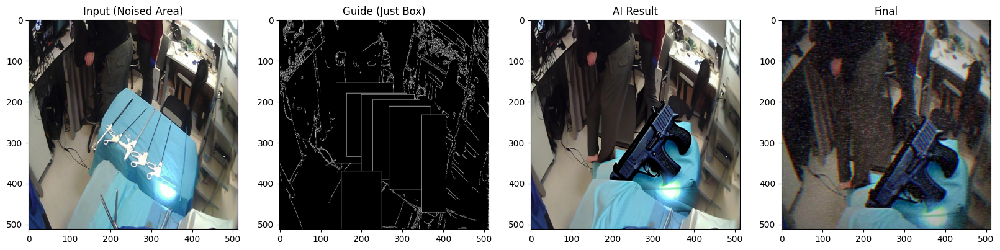

[2/5] מעבד: Frame_22_jpg.rf.3b228a1b0882798af813f2dbe0728157.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

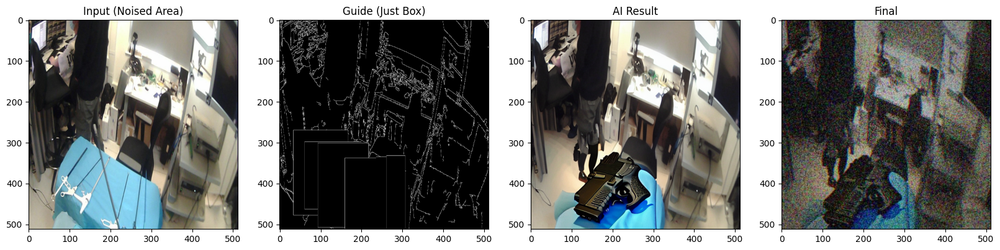

[3/5] מעבד: Frame_247_jpg.rf.92c45b87e70feb2c1b8c751bbdfd297d.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

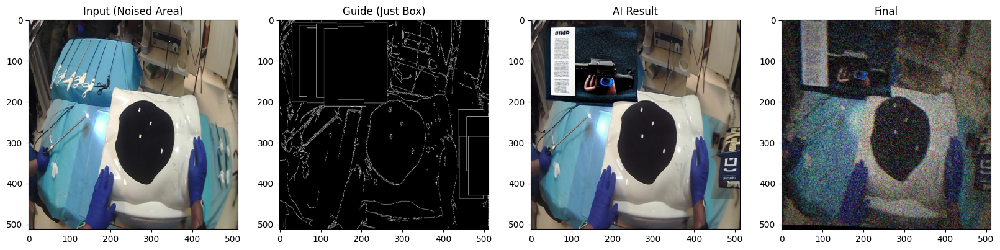

[4/5] מעבד: Frame_346_jpg.rf.825441238795ec1f14d60db09bc00ace.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

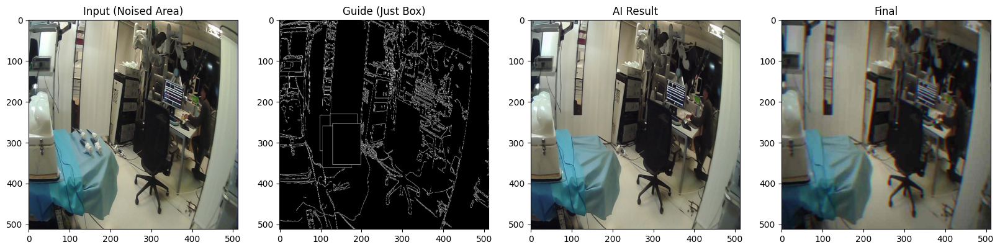

[5/5] מעבד: Frame_368_jpg.rf.11b786569f274f764104147da14ee996.jpg...


  0%|          | 0/50 [00:00<?, ?it/s]

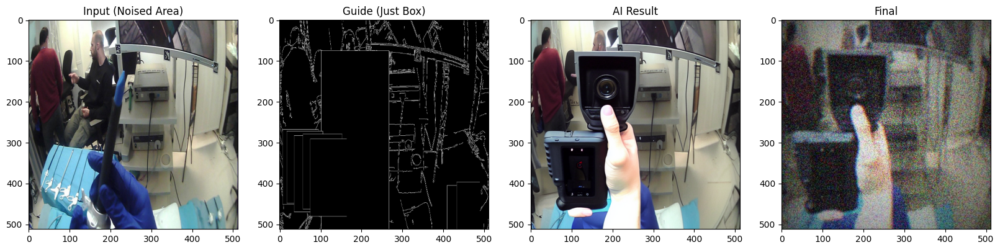

In [ ]:
import os
import glob
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from diffusers import StableDiffusionControlNetInpaintPipeline, ControlNetModel, UniPCMultistepScheduler

# ==========================================
# 🎛️ הגדרות משתמש - התחלה נקייה (חופש ל-AI) 🎛️
# ==========================================

MODE = "surgery"
LOCAL_DATASET_PATH = "/content/my_dataset/surgery"

# פרומפט חזק שמתאר אקדח ריאליסטי מונח על בד
PROMPT = "A photorealistic top-down photo of a black Glock 19 pistol lying on a blue medical cloth. The gun has a matte black polymer frame, steel slide, realistic texture, soft shadows, sharp focus."

# נגטיב כדי למנוע ממנו לצייר כלים רפואיים
NEGATIVE = "surgical tool, scissors, scalpel, metal tray, silver, chrome, shiny, medical equipment, cartoon, drawing, sketch, blurry, low quality, distorted, deformed"

# 🔥 שחרור השליטה - זה הסוד 🔥
# אנחנו נותנים לו רק קופסה כללית, והוא יחליט איך האקדח נראה
CONTROL_SCALE = 0.4      # נמוך! אל תיצמד לקווים, תקשיב לפרומפט
GUIDANCE_SCALE = 15.0    # גבוה! הפרומפט הוא המלך
GUIDANCE_END = 0.4       # תפסיק להסתכל על ה-Guide אחרי 40% מהזמן

GUN_PADDING = 40         # קצת מרווח מסביב לכלי כדי שייכנס אקדח שלם

# ==========================================

# 1. טעינת מודל
if 'pipe' not in globals():
    if not torch.cuda.is_available(): raise Exception("❌ חובה GPU!")
    controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
    pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
        "runwayml/stable-diffusion-inpainting", controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
    ).to("cuda")
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
    pipe.enable_model_cpu_offload()
    print("✅ מודל מוכן.")

# 2. איסוף תמונות
all_images = sorted(glob.glob(os.path.join(LOCAL_DATASET_PATH, "*.jpg")))
valid_images = [img for img in all_images if os.path.exists(img.replace(".jpg", ".txt"))]

print(f"🧪 מתחיל בדיקה על {len(valid_images)} תמונות...")

# 3. הרצה
for i, img_path in enumerate(valid_images):
    filename = os.path.basename(img_path)
    txt_path = img_path.replace(".jpg", ".txt")

    original_img_cv = cv2.imread(img_path)
    h, w = original_img_cv.shape[:2]

    # קריאת כל התיוגים (תומך גם ב-POLYGONS וגם ב-YOLO)
    all_boxes = []
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            try:
                parts = list(map(float, line.strip().split()))
                if len(parts) == 5:
                    all_boxes.append(parts)
                elif len(parts) > 5:
                    cls_id = parts[0]; coords = parts[1:]
                    xs = coords[0::2]; ys = coords[1::2]
                    min_x = min(xs); max_x = max(xs); min_y = min(ys); max_y = max(ys)
                    bw = max_x - min_x; bh = max_y - min_y
                    xc = min_x + bw/2; yc = min_y + bh/2
                    all_boxes.append([cls_id, xc, yc, bw, bh])
            except: continue

    if not all_boxes: continue

    # משתמשים בכל הקופסאות שמצאנו
    target_boxes = all_boxes

    # הכנת קנבס
    mask_cv = np.zeros((h, w), dtype=np.uint8)
    gray = cv2.cvtColor(original_img_cv, cv2.COLOR_BGR2GRAY)
    canny_cv = cv2.Canny(gray, 50, 150)

    # יצירת המסיכה לכל הכלים
    for box in target_boxes:
        _, x_c, y_c, bw, bh = box

        # המרה לפיקסלים
        x1 = int((x_c - bw/2) * w); y1 = int((y_c - bh/2) * h)
        x2 = int((x_c + bw/2) * w); y2 = int((y_c + bh/2) * h)

        # הרחבה (Padding) כדי שיהיה מקום לאקדח שמן
        x1 = max(0, x1 - GUN_PADDING)
        y1 = max(0, y1 - GUN_PADDING)
        x2 = min(w, x2 + GUN_PADDING)
        y2 = min(h, y2 + GUN_PADDING)

        # 1. צביעת המסיכה בלבן (כאן ה-AI יעבוד)
        cv2.rectangle(mask_cv, (x1, y1), (x2, y2), 255, -1)

        # 2. ניקוי ה-Guide המקורי (מוחקים את המספריים מה-Canny)
        cv2.rectangle(canny_cv, (x1, y1), (x2, y2), 0, -1)

        # 3. ציור ריבוע כללי ב-Canny (במקום אקדח)
        # זה רק אומר ל-AI: "החפץ נמצא בגבולות האלה", אבל לא אומר לו איזו צורה יש לו.
        cv2.rectangle(canny_cv, (x1, y1), (x2, y2), 255, 1)

    # מחיקת התוכן המקורי עם רעש כהה (כדי שה-AI לא יראה מספריים)
    inpainting_source_cv = original_img_cv.copy()
    dark_noise = np.random.randint(0, 60, (h, w, 3), dtype=np.uint8) # רעש אפור כהה
    inpainting_source_cv = np.where(mask_cv[..., None] == 255, dark_noise, inpainting_source_cv)

    # המרות
    original_pil = Image.fromarray(cv2.cvtColor(inpainting_source_cv, cv2.COLOR_BGR2RGB)).resize((512, 512))
    mask_pil = Image.fromarray(mask_cv).resize((512, 512))
    canny_final = Image.fromarray(cv2.resize(canny_cv, (512, 512)))
    original_full_view = Image.fromarray(cv2.cvtColor(original_img_cv, cv2.COLOR_BGR2RGB)).resize((512,512))

    print(f"[{i+1}/{len(valid_images)}] מעבד: {filename}...")

    # הרצה
    ai_result = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE,
        image=original_pil,
        mask_image=mask_pil,
        control_image=canny_final,
        num_inference_steps=50,
        guidance_scale=GUIDANCE_SCALE,
        controlnet_conditioning_scale=CONTROL_SCALE,
        control_guidance_end=GUIDANCE_END # עוצר מוקדם כדי לתת ל-AI יצירתיות
    ).images[0]

    # אפקטים
    try:
        final_result = apply_bodycam_effects(ai_result)
    except:
        final_result = ai_result

    # תצוגה
    f, axarr = plt.subplots(1, 4, figsize=(20, 5))
    axarr[0].imshow(original_full_view); axarr[0].set_title("Input (Noised Area)")
    axarr[1].imshow(canny_final, cmap='gray'); axarr[1].set_title("Guide (Just Box)")
    axarr[2].imshow(ai_result); axarr[2].set_title("AI Result")
    axarr[3].imshow(final_result); axarr[3].set_title("Final")
    plt.show()

### 7. Try to inpaint batch dataset

In [ ]:
import os
import glob
import cv2
import numpy as np
import torch
import random
from PIL import Image
from diffusers import StableDiffusionControlNetInpaintPipeline, ControlNetModel, UniPCMultistepScheduler
from google.colab import drive

# 1. חיבור ל-Drive
drive.mount('/content/drive')

# ==========================================
# 📂 הגדרת נתיבים
# ==========================================
INPUT_ROOT = "/content/my_dataset/my_dataset"
OUTPUT_DIR_ROOT = "/content/drive/MyDrive/Synthetic_Dataset"

TARGETS = {
    "hands": 1000,
    "surgery": 301
}

# ==========================================
# 🧠 טעינת מודלים
# ==========================================
if 'pipe' not in globals():
    print("⏳ טוען מודלים ל-GPU...")
    controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
    pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
        "runwayml/stable-diffusion-inpainting", controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
    ).to("cuda")
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
    pipe.enable_xformers_memory_efficient_attention()
    pipe.enable_model_cpu_offload()

def draw_gun_template_hands(img, x1, y1, x2, y2):
    center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
    cv2.rectangle(img, (center_x - 25, center_y - 40), (center_x + 25, center_y + 30), 255, 2)
    cv2.circle(img, (center_x, center_y - 10), 12, 255, 2)

# ==========================================
# 🔄 לולאת העיבוד
# ==========================================

for MODE, target_count in TARGETS.items():
    input_folder = os.path.join(INPUT_ROOT, MODE)
    output_folder = os.path.join(OUTPUT_DIR_ROOT, MODE)
    os.makedirs(output_folder, exist_ok=True)

    all_imgs = glob.glob(os.path.join(input_folder, "*.jpg")) + glob.glob(os.path.join(input_folder, "*.JPG"))
    valid_files = [f for f in all_imgs if os.path.exists(os.path.splitext(f)[0] + ".txt")]

    if not valid_files:
        print(f"❌ לא נמצאו קבצים בתיקייה: {input_folder}")
        continue

    files_to_process = random.sample(valid_files, min(target_count, len(valid_files)))
    print(f"🚀 מתחיל עיבוד: {MODE} | יעד: {len(files_to_process)}")

    for i, img_path in enumerate(files_to_process):
        filename = os.path.basename(img_path)
        file_root = os.path.splitext(img_path)[0]
        save_img_path = os.path.join(output_folder, f"synth_{i}_{filename}")
        save_txt_path = os.path.join(output_folder, f"synth_{i}_{os.path.basename(file_root)}.txt")

        if os.path.exists(save_img_path): continue

        if MODE == "hands":
            PROMPT = "POV police bodycam, black Glock 19 pistol, realistic muzzle, metallic slide, gritty video quality"
            NEG = "toy, plastic, cartoon, blurry, deformed hands, white rectangle"
            C_SCALE, PAD, G_SCALE, G_END = 0.35, 80, 8.5, 1.0
        else:
            PROMPT = "Glock 19 pistol lying on blue medical cloth, top-down view, realistic lighting, sharp focus"
            NEG = "shiny, chrome, surgical tools, scissors, blurry, low quality"
            C_SCALE, PAD, G_SCALE, G_END = 0.4, 40, 15.0, 0.4

        img_cv = cv2.imread(img_path)
        if img_cv is None: continue
        h, w = img_cv.shape[:2]

        with open(file_root + ".txt", 'r') as f:
            lines = f.readlines()

        boxes = []
        for line in lines:
            p = list(map(float, line.strip().split()))
            if len(p) == 5: boxes.append(p)

        if not boxes: continue

        mask_cv = np.zeros((h, w), dtype=np.uint8)
        canny_cv = cv2.Canny(cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY), 50, 150)
        target_boxes = [min(boxes, key=lambda x: x[2])] if MODE == "hands" else boxes
        new_labels = []

        for box in target_boxes:
            _, xc, yc, bw, bh = box
            x1, y1 = int((xc - bw/2) * w), int((yc - bh/2) * h)
            x2, y2 = int((xc + bw/2) * w), int((yc + bh/2) * h)
            x1p, y1p, x2p, y2p = max(0, x1-PAD), max(0, y1-PAD), min(w, x2+PAD), min(h, y2+PAD)

            cv2.rectangle(mask_cv, (x1p, y1p), (x2p, y2p), 255, -1)
            cv2.rectangle(canny_cv, (x1p, y1p), (x2p, y2p), 0, -1)

            if MODE == "hands": draw_gun_template_hands(canny_cv, x1p, y1p, x2p, y2p)
            else: cv2.rectangle(canny_cv, (x1p, y1p), (x2p, y2p), 255, 1)

            new_labels.append(f"0 {(x1p+x2p)/2/w:.6f} {(y1p+y2p)/2/h:.6f} {(x2p-x1p)/w:.6f} {(y2p-y1p)/h:.6f}\n")

        src_cv = img_cv.copy()
        if MODE == "hands":
            src_cv[mask_cv == 255] = [127, 127, 127]
        else:
            src_cv = np.where(mask_cv[..., None] == 255, np.random.randint(0, 60, (h, w, 3), dtype=np.uint8), src_cv)

        res = pipe(prompt=PROMPT, negative_prompt=NEG,
                   image=Image.fromarray(cv2.cvtColor(src_cv, cv2.COLOR_BGR2RGB)).resize((512, 512)),
                   mask_image=Image.fromarray(mask_cv).resize((512, 512)),
                   control_image=Image.fromarray(cv2.resize(canny_cv, (512, 512))),
                   num_inference_steps=30, guidance_scale=G_SCALE,
                   controlnet_conditioning_scale=C_SCALE, control_guidance_end=G_END).images[0]

        res.save(save_img_path)
        with open(save_txt_path, 'w') as f: f.writelines(new_labels)

        if (i+1) % 10 == 0: print(f"✅ {MODE}: {i+1}/{len(files_to_process)} הושלמו")

# ==========================================
# 📊 סיכום סופי של הקבצים בדרייב
# ==========================================
print("\n--- 📊 סיכום דאטה-סט בדרייב ---")
for MODE in TARGETS.keys():
    folder = os.path.join(OUTPUT_DIR_ROOT, MODE)
    imgs = len(glob.glob(os.path.join(folder, "*.jpg")))
    txts = len(glob.glob(os.path.join(folder, "*.txt")))
    print(f"📁 מצב {MODE.upper()}:")
    print(f"   🖼️ תמונות: {imgs}")
    print(f"   📄 קבצי לייבל: {txts}")

print("\n🎉 המשימה הושלמה!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🚀 מתחיל עיבוד: hands | יעד: 1000


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 10/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 20/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 30/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 40/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 50/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 60/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 70/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 80/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 90/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 100/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 110/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 120/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 130/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 140/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 150/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 160/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 170/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 180/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 190/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 200/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 210/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 220/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 230/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 240/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 250/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 260/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 270/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 280/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 290/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 300/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 310/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 320/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 330/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 340/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 350/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 360/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 370/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 380/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 390/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 400/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 410/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 420/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 430/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 440/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 450/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 460/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 470/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 480/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 490/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 500/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 510/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 520/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 530/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 540/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 550/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 560/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 570/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 580/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 590/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 600/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 610/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 620/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 630/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 640/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 650/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 660/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 670/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 680/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 690/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 700/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 710/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 720/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 730/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 740/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 750/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 760/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 770/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 780/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 790/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 800/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 810/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 820/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 830/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 840/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 850/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 860/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 870/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 880/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 890/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 900/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 910/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 920/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 930/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 940/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 950/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 960/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 970/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 980/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 990/1000 הושלמו


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

✅ hands: 1000/1000 הושלמו
🚀 מתחיל עיבוד: surgery | יעד: 301

--- 📊 סיכום דאטה-סט בדרייב ---
📁 מצב HANDS:
   🖼️ תמונות: 1001
   📄 קבצי לייבל: 1001
📁 מצב SURGERY:
   🖼️ תמונות: 5
   📄 קבצי לייבל: 5

🎉 המשימה הושלמה!


### 8. Baseline dataset prep

In [ ]:
import os
import random
import shutil

# נתיבים
SOURCE_DIR = '/content/drive/MyDrive/Bodycam_Final_Dataset' # ה-623 שעבדנו עליהן
BASE_DIR = '/content/yolo_dataset'

# 1. יצירת המבנה
for split in ['train', 'val', 'test']:
    os.makedirs(f'{BASE_DIR}/images/{split}', exist_ok=True)
    os.makedirs(f'{BASE_DIR}/labels/{split}', exist_ok=True)

# 2. חלוקה (Split)
images = [f for f in os.listdir(SOURCE_DIR) if f.lower().endswith('.jpg')]
random.seed(42)
random.shuffle(images)

train_idx = int(len(images) * 0.8)
val_idx = int(len(images) * 0.9)

splits = {'train': images[:train_idx], 'val': images[train_idx:val_idx], 'test': images[val_idx:]}

for split, files in splits.items():
    for f in files:
        shutil.copy(f'{SOURCE_DIR}/{f}', f'{BASE_DIR}/images/{split}/{f}')
        label = f.replace('.jpg', '.txt')
        if os.path.exists(f'{SOURCE_DIR}/{label}'):
            shutil.copy(f'{SOURCE_DIR}/{label}', f'{BASE_DIR}/labels/{split}/{label}')

# 3. יצירת data.yaml
yaml_content = f"train: {BASE_DIR}/images/train\nval: {BASE_DIR}/images/val\ntest: {BASE_DIR}/images/test\nnc: 1\nnames: ['weapon']"
with open(f'{BASE_DIR}/data.yaml', 'w') as f:
    f.write(yaml_content)

print("✅ Baseline Dataset ready!")

✅ Baseline Dataset ready!


###9. Ultralytics install

In [ ]:
!pip install ultralytics

###10. Create drive training folder

In [ ]:
import shutil
from google.colab import drive
import os

# חיבור לדרייב
drive.mount('/content/drive')

# יצירת תיקיית יעד בדרייב (עם תאריך כדי שלא יתבלבל)
destination = '/content/drive/MyDrive/YOLO_Training_Final_100'

# העתקת התיקייה
if os.path.exists('/content/Bodycam_Pistol_Detection'):
    shutil.copytree('/content/Bodycam_Pistol_Detection', destination, dirs_exist_ok=True)
    print(f"✅ הכל נשמר בדרייב בכתובת: {destination}")
else:
    print("❌ לא נמצאה תיקיית התוצאות. בדוק ב-runs/detect/train")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ הכל נשמר בדרייב בכתובת: /content/drive/MyDrive/YOLO_Training_Final_100


###11. Baseline Train

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt') # השתמשתי ב-Small במקום Nano לדיוק גבוה יותר

model.train(
    data=f'{BASE_DIR}/data.yaml',
    epochs=100,
    imgsz=640,
    batch=16,
    save=True,
    project='Bodycam_Pistol_Detection',
    name='baseline_real_data'
)

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=baseline_real_data, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e2c85859b20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

###12. For showing colab notebook in git

In [ ]:
import json

notebook_filename = '/content/drive/MyDrive/Colab Notebooks/bodycam_weapon_detection.ipynb' # <--- UPDATED PATH

try:
    with open(notebook_filename, 'r') as f:
        notebook_content = json.load(f)

    if 'metadata' in notebook_content and 'widgets' in notebook_content['metadata']:
        del notebook_content['metadata']['widgets']
        print(f"Successfully removed 'metadata.widgets' from {notebook_filename}")
    else:
        print(f"'metadata.widgets' not found in {notebook_filename}. No changes needed.")

    with open(notebook_filename, 'w') as f:
        json.dump(notebook_content, f, indent=4)

    print(f"Cleaned notebook saved back to {notebook_filename}")

except FileNotFoundError:
    print(f"Error: Notebook file '{notebook_filename}' not found. Make sure the path is correct.")
except Exception as e:
    print(f"An error occurred: {e}")

Successfully removed 'metadata.widgets' from /content/drive/MyDrive/Colab Notebooks/bodycam_weapon_detection.ipynb
Cleaned notebook saved back to /content/drive/MyDrive/Colab Notebooks/bodycam_weapon_detection.ipynb
